In [1]:
using Distributions
using LinearAlgebra
using Turing
using ForwardDiff
using ReverseDiff
using MCMCChains
using StatsBase
using StatsPlots
using StatsModels
using Statistics
using Random
using Base.Iterators
using Plots
using DataFrames
using Quadrature
using GBIF
using Rasters
using Suppressor

### Introduction

The Principle of Maximum Entropy is an alternative form of inference which grew out of Statisical Mechanics in Physics. To quote Wikipedia,

https://en.wikipedia.org/wiki/Principle_of_maximum_entropy

It states that the probability distribution which best represents the current state of knowledge about a system is the one with largest entropy, in the context of precisely stated prior data. Bringing it back to Statistical Mechanics, a gas of constant temperature follow a Maxwell-Boltzmann distribution which maximizes its entropy while keeping the average energy constant.

In the following cases, we will be looking at the entropy provided by Jayne:

$-\int_{\vec{x} \in \mathbb{R}^{n}} p(\vec{x})\ln\left[p(\vec{x})\right] d^{(n)}\vec{x}$

but it will still be maximized with respect to requiring that the empiracal mean of observed values of functions, $\bar{f}$, match the expectation value of the function:

$\int_{\vec{x} \in \mathbb{R}^{n}} f(\vec{x}) p(\vec{x}) d^{(n)}\vec{x} = \bar{f}$. These functions can be continous, discrete or categorical but the central take-away is that they are functions of the underlying space, $\vec{x}$. For the purposes of this notebook, we will think of space as physical location. As for the functions, GIS examples include:

1) wind speed, which is a vector function of location,

$\vec{v}(\vec{x})$
or

2) the vegetation index NVDI,

$NDVI(\vec{x})$

which is a scalar function of location.

In order to maximize the entropy with respect to the empiracal means, we use the language of lagrange multipliers:

$S = \int_{\vec{x} \in \mathbb{R}^{n}} p(\vec{x})\ln\left[p(\vec{x})\right] d^{(n)}\vec{x} + \sum_{i} \beta_{i}\left( \int_{\vec{x} \in \mathbb{R}^{n}} f_{i}(\vec{x}) p(\vec{x}) d^{(n)}\vec{x} - \bar{f}_{i} \right) + \beta_{0}\left( \int_{\vec{x} \in \mathbb{R}^{n}}p(\vec{x}) d^{(n)}\vec{x} - 1 \right)$

where the $\beta$s are lagrange multipliers for each observed function and the requirement that the probability density must sum to 1.

Maximizing with respect to each of the lagrange multipliers give the conditions but maximizing with respect to the probability density gives:

$\frac{\partial{S}}{\partial{p}} = -1 -\ln\left[p(\vec{x})\right] + \sum_{i} \beta_{i}f_{i}(\vec{x}) + \beta_{0} = 0$

which evaluates to

$p(\vec{x}) = \frac{e^{\sum_{i} \beta_{i}f_{i}(\vec{x})}}{e^{1-\beta_{0}}} = \frac{e^{\sum_{i} \beta_{i}f_{i}(\vec{x})}}{\int e^{\sum_{i} \beta_{i}f_{i}(\vec{x})} d^{(n)}\vec{x}} = \frac{e^{\sum_{i} \beta_{i}f_{i}(\vec{x})}}{Z}$

where the second equivalence recognizes the denominator as a normalization and the third equivalence recognizes the normalization as the partition function, Z. In the subsequent analyses we will be using Bayesian inference to find the optimal lagrange multipliers and hence the probability distributions which maximize the Jayne entropy of gradually more complicated systems.
"""

### Bayesian Inference

The posterior distribution is a combination of likelihood and prior:

$\pi\left(\beta | data \right) = \frac{L\left(data| \beta\right) \pi(\beta)}{\pi(data)}$

$\pi\left(\beta | data \right) = \frac{\Pi_{j}^{n}\frac{e^{\sum_{i} \beta_{i}f_{i}(\vec{x}_{j})}}{Z} \pi(\beta)}{\pi(data)}$

To do Markov Chain Monte Carlo, we calculate the logarithm of the posterior distribution and remove the constant $\pi(data)$ as it is common between all evaluations.

$\ell\pi\left(\beta | data \right) = \sum_{j}^{n} \left(\sum_{i} \beta_{i}f_{i}(\vec{x}_{j}) - \log(Z)\right) + \log\left(\pi(\beta)\right)$

$\ell\pi\left(\beta | data \right) = \sum_{j}^{n} \sum_{i} \beta_{i}f_{i}(\vec{x}_{j}) - n\log(Z) + \log\left(\pi(\beta)\right)$

Now that we know the logarithm of the posterior for the distribution of maximum entropy, we can create a function to sample from it. I will use the Julia package Turing to sample from various posteriors using Markov Chain Monte Carlo(MCMC):

## Reconstructing a Normal Distribution

We first begin with the simplest distribution, the normal distribution. We first generate a random sample from a normal distribution with mean of $0$ and standard deviation of $2$ in the space of real numbers, $x \in \mathbb{R}$. Our goal is to reverse engineer the probability distribution which generated this presence data using two functions of the space: the value of the observed value of the space, $x$ and the square of the observed value of the space, $x^2$. We first generate a set of random numbers with the required distribution:

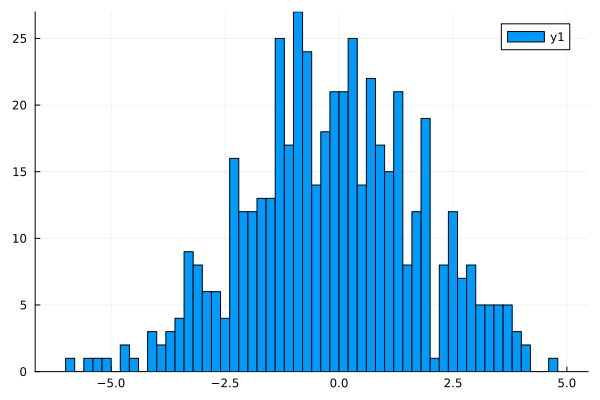

In [2]:
begin
	n_normal = 500
	x_sample = rand.(Normal(0.0, 2.0), n_normal);
	histogram(x_sample, bins=50);
end

Next we program our inference function. This creates the log of the posterior so that Turing can sample from it. We first create a helper function though:

In [3]:
function beta_matrix(v)
    n = length(v)
    s = Int(round((sqrt(8*n+1)-1)/2))
    return [ i<=j ? v[Int(j*(j-1)/2+i)] : 0 for i=1:s, j=1:s ]
end;

This function is used to convert a vector of $\beta$s into an upper triangular matrix so that we can conduct the following operation resulting in the sum of square of features and feature interactions:

$f^{T} B f = \left(\begin{matrix} f_{1} & f_{2} & f_{3} \end{matrix} \right)
\left(
\begin{matrix}
\beta_{1} & \beta_{2} & \beta_{3}\\
0 & \beta_{4} & \beta_{5}\\
0 & 0 & \beta_{6}
\end{matrix}
\right)
\left(\begin{matrix} f_{1} \\ f_{2} \\ f_{3} \end{matrix} \right)$

Now we move on to programming the log of the posterior:

In [4]:
@model function ℓπ_normal(num_features, samples)

	#The number of lagrange multipliers to cover the square of the features and the
	#interactions between features
	d_interactions = Int(num_features*(num_features+1)/2)

	#The total number of lagrange multipliers needed
    d_total = num_features + d_interactions

	#The priors on the lagrange multipliers will be Laplace which is equivalent to L1 normalization
    β ~ filldist(Laplace(0.0, 1.0), d_total)

	#Splitting the lagrange multipliers into the linear and non-linear terms
	linear_β = β[1:num_features]
    interacting_β = β[num_features+1:end]
    interacting_β_matrix = beta_matrix(interacting_β)

	#The first portion of the log-posterior is the sum over presence samples
	log_post = 0.0
	@inbounds for i in 1:size(samples)[1]
    	x = samples[i, :]
        log_post += dot(linear_β, x') + dot(interacting_β_matrix * x, x')
    end

	#To calculate the partition function, we do an integration over the domain
	function density(y, p)
        return exp(dot(linear_β, y') + dot(interacting_β_matrix*y, y'))
    end

    prob = QuadratureProblem(density, -Inf, Inf)
    normalization = solve(prob, HCubatureJL(), reltol=1e-6, abstol=1e-6)[1]

	#Add to the log posterior the partition function portion
    log_post += -size(samples)[1]*log(normalization)

	Turing.@addlogprob! log_post
end;

and finally sample using the No-U-Turn Sampler(NUTS). We add the supress line due to a package not yet being updated to the most recent standard that will be depreciated after 1.9

In [12]:
ℓπ = ℓπ_normal(1, x_sample);
normal_chain = sample(ℓπ, NUTS(200, 0.65), MCMCThreads(), 2_500, 4; discard_adapt=true);
println()

┌ Warning: Only a single thread available: MCMC chains are not sampled in parallel
└ @ AbstractMCMC ~/.julia/packages/AbstractMCMC/fWWW0/src/sample.jl:296
┌ Warning: Backwards compatability support of the new return codes to Symbols will be deprecated with the Julia v1.9 release. Please see https://docs.sciml.ai/SciMLBase/stable/interfaces/Solutions/#retcodes for more information
└ @ SciMLBase ~/.julia/packages/SciMLBase/DPrcG/src/retcodes.jl:354
┌ Warning: Backwards compatability support of the new return codes to Symbols will be deprecated with the Julia v1.9 release. Please see https://docs.sciml.ai/SciMLBase/stable/interfaces/Solutions/#retcodes for more information
└ @ SciMLBase ~/.julia/packages/SciMLBase/DPrcG/src/retcodes.jl:354
┌ Warning: Backwards compatability support of the new return codes to Symbols will be deprecated with the Julia v1.9 release. Please see https://docs.sciml.ai/SciMLBase/stable/interfaces/Solutions/#retcodes for more information
└ @ SciMLBase ~/.julia/pa

Let's visualize the posteriors of the lagrange multipliers!

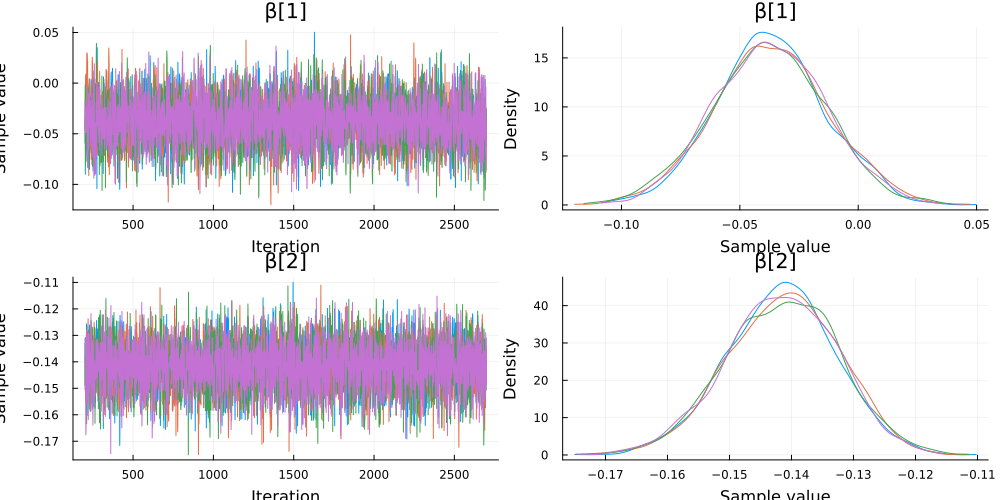

In [13]:
plot(normal_chain)

We'll get to this making sense in a bit but first let's check convergence. The Gelman, Rubin, and Brooks diagnostic should be close to one for each parameter:


In [14]:
gelmandiag(normal_chain)

Gelman, Rubin, and Brooks diagnostic
  parameters      psrf    psrfci 
      Symbol   Float64   Float64 

        β[1]    1.0006    1.0015
        β[2]    1.0003    1.0008


Looking good. Now we ask ourselves does this make sense? We have the posterior distributions of the two lagrange multipliers. What do they mean? We maximized the entropy such that the empirical averages of the variable $x$ and $x^2$ match the expectation values of the distribution:

$p(x|\beta) = \frac{e^{\beta_1 x + \beta_2 x^2}}{Z}$

with respect to $x$ and $x^2$. But it was supposed to match the Normal distribution:

$\frac{1}{\sqrt{2 \pi \sigma^2}} e^{-\frac{1}{2\sigma^2}\left(x-\bar{x}\right)^2}$

Expanding the normal distribution out:

$\frac{e^{-\frac{1}{2\sigma^2}\bar{x}^2}}{\sqrt{2 \pi \sigma^2}} e^{-\frac{1}{2\sigma^2}x^2 + \frac{\bar{x}}{\sigma^2}x}$

we find that the lagrange multipliers must match the coefficients in front of the $x$ and $x^2$. One might be tempted to say this is just normal fitting of a Normal distribution but that would be incorrect. Remember that we must match the empirical mean and standard deviation and not the true mean and standard deviation that our data was generated with. Let's do a quick check to make sure the means of our posteriors are in the ballpark of a quick calculation of the lagrange multipliers using the mean and variance:


Calculating the coefficient of $x$:

In [15]:
mean(x_sample)/(var(x_sample))

-0.037894061576982746

and of $x^2$:

In [16]:
-1/(2*var(x_sample))

-0.1405875827843897

and finally outputting some stats on the posteriors:

In [20]:
normal_chain

Chains MCMC chain (2500×14×4 Array{Float64, 3}):

Iterations        = 201:1:2700
Number of chains  = 4
Samples per chain = 2500
Wall duration     = 12.86 seconds
Compute duration  = 12.8 seconds
parameters        = β[1], β[2]
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std      mcse    ess_bulk    ess_tail      rhat   ⋯
      Symbol   Float64   Float64   Float64     Float64     Float64   Float64   ⋯

        β[1]   -0.0373    0.0238    0.0003   6784.9153   5863.8572    1.0004   ⋯
        β[2]   -0.1415    0.0090    0.0001   9002.5621   7190.4029    1.0003   ⋯
                                                                1 column omitted

Quantiles
  parameters      2.5%     25.0%     50.0%     75.0%     97.5% 
      Symbol   Float64   Float64   Float64   Float64   Float64 

    

We find that our estimates are spot on! As with any Bayesian result, we get uncertainties as well as predictions given that the underlying lagrange multipliers are treated as random variables instead of fixed:


In [21]:
function predict_normal(samples, βs)
	n = 1
	linear_β = βs[1:n]
    interacting_β = βs[n+1:end]
    interacting_β_matrix = beta_matrix(interacting_β)

	predictions = zeros(size(samples))

	function density(y, p)
    	return exp(dot(linear_β, y') + dot(interacting_β_matrix*y, y'))
    end

	for i in 1:size(samples)[1]
		y = samples[i]
		predictions[i] = exp(dot(linear_β, y') + dot(interacting_β_matrix*y, y'))
	end

    prob = QuadratureProblem(density, -Inf, Inf)
    Z = solve(prob, HCubatureJL(), reltol=1e-6, abstol=1e-6)[1]

	return predictions ./ Z
end;

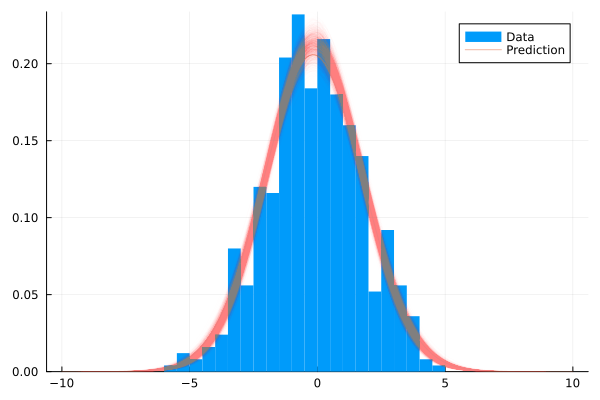

In [25]:
@suppress begin
    βs = Matrix(DataFrame(normal_chain))[1:2000, 3:4];
    
    x = collect(-10:0.1:10)
    
    histogram(x_sample, normed=true, label="Data", bins = 40,
              linecolor = :transparent)
    
    pred = predict_normal(x, βs[1, :])
    plot!(x, pred, alpha=0.5, label="Prediction")
    
    for i in 2:size(βs)[1]
        β = βs[i, :]
        predictions = predict_normal(x, β)
        plot!(x, predictions, alpha=0.005, linecolor="red", label="")
    end
    current()
end